<img src='http://www-scf.usc.edu/~ghasemig/images/sharif.png' alt="SUT logo" width=300 height=300 align=left class="saturate" >

<br>
<font>
<div dir=ltr align=center>
<font color=0F5298 size=7>
    Artificial Intelligence <br>
<font color=2565AE size=5>
    Computer Engineering Department <br>
    Spring 2023<br>
<font color=3C99D size=5>
    Practical Assignment 3 - Reinforcement Learning <br>
<font color=696880 size=4>
    Mohammad Moshtaghi - Ali Salesi - Hossein Goli

____

# Personal Data

In [134]:
# Set your student number
student_number = '98104852'
first_name = 'Ahamdreza'
last_name = 'Tavana'

In [135]:
!pip install gym[toy_text]
import gym 
import numpy as np
from IPython.display import clear_output
import matplotlib.pyplot as plt
import os
from tqdm import trange
os.environ["SDL_VIDEODRIVER"] = "dummy"
clear_output() # You can use this method to clear your cell's output. 

# Q1: Q-Learning (100 Points)

<font size=4>
Author: Mohammad Moshtaghi
<br/>
<font color=red>
Please run all the cells.
</font>
</font>
<br/>
</div>

# 1. Cliff Walking (70 pts)

In this section we are going to implement different Temporal Difference algorithms and compare their results. We start with a simple problem called **Cliff Walking**. You may have seen this game in your lecture slides and here we are going to train an RL Agent to play this game optimally.

First, lets get familiar with game's environment.

## 1-1. Environment (10 pts)

Lets declare our environment and see some of its hyperparameters.

In [136]:
env = gym.make('CliffWalking-v0', render_mode='rgb_array')
spec = gym.spec('CliffWalking-v0')

print(f"Action Space: {env.action_space}")
print(f"Observation Space: {env.observation_space}")
print(f"Max Episode Steps: {spec.max_episode_steps}")
print(f"Nondeterministic: {spec.nondeterministic}")
print(f"Reward Range: {env.reward_range}")
print(f"Reward Threshold: {spec.reward_threshold}\n")

Action Space: Discrete(4)
Observation Space: Discrete(48)
Max Episode Steps: None
Nondeterministic: False
Reward Range: (-inf, inf)
Reward Threshold: None



In [137]:
Actions =  {0: 'UP', 
            1: 'RIGHT',
            2: 'DOWN',
            3: 'LEFT'}

You can use **_visualize_** function to draw your state.

In [138]:
def visualize(env, action=None, reward=None):
    env_screen = env.render()
    plt.imshow(env_screen)
    plt.axis('off');
    title = ''
    if action:
        title += f'Action: {Actions[action]}'
    if reward:
        title += f'Reward: {reward}'
    
    plt.title(title)
    plt.show()

Test `visualize` function with a random action. First, using `env.reset` function, we reset our environment so that our agent returns to the starting point. for moving your agent, use `env.step` function. it returns four values:

1. next_state
2. reward
3. done
4. some info (Honestly, it doesn't matter)

You may need this functions later :)



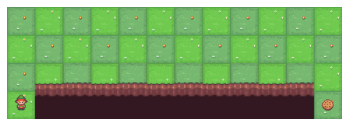

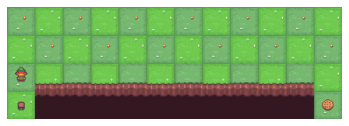

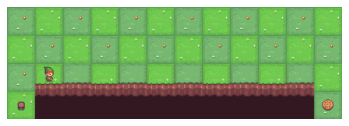

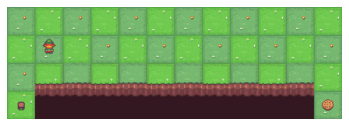

In [139]:
env.reset() # You can use this function to reset your environment.
######################## YOUR CODE HERE ########################
visualize(env)
env.step(0)
visualize(env)
env.step(1)
visualize(env)
env.step(0)
visualize(env)

######################## END YOUR CODE #########################

## 1-2. Agent

Please read the class below. You must inherite this class in the following sections and implement different RL algorithms.

In [140]:
import numpy as np

class Agent:
    def __init__(self, env, noise):
        self.q_values = None
        self.policy = {}
        self.env = env
        self.noise = noise

    def learn(self, num_episodes, alpha, gamma, epsilon):

        number_actions = self.env.num_actions
        number_states = self.env.num_states
        self.q_values = np.zeros((number_states, number_actions))

        for episode in range(num_episodes):
            state = self.env.reset()
            done = False

            while not done:
                if np.random.rand() < epsilon:
                    action = np.random.randint(number_actions)
                else:
                    action = np.argmax(self.q_values[state])

                next_state, reward, done = self.env.step(action)

                self.q_values[state][action] += alpha * (reward + gamma * np.max(self.q_values[next_state]) - self.q_values[state][action])

                state = next_state

        self.create_policy()

    def create_policy(self):

        self.policy = {state: np.argmax(q_values) for state, q_values in enumerate(self.q_values)}

    def act(self):
        state = self.env.get_current_state()
        action = self.policy[state]
        self.env.step(action)

    def evaluate(self, num_episodes):

        rewards = []

        for episode in range(num_episodes):
            state = self.env.reset()
            done = False
            episode_reward = 0

            while not done:
                action = self.policy[state]
                next_state, reward, done = self.env.step(action)
                episode_reward += reward
                state = next_state

            rewards.append(episode_reward)

        return np.mean(rewards)


## 1-3. Q-Learning (15 pts)

In this section, you must use **_Q-Learning_** algorithm to train your agent. Note that the action-value function Q(s,a) is updated iteratively as follows:

$$ Q(s,a) \leftarrow Q(s,a) + \alpha \left( r + \gamma \max_{a'} Q(s',a') - Q(s,a) \right) $$

where ‍‍‍‍‍`r` is the reward received after taking action a in state `s`, `s'` is the new state, $\gamma$ is the discount factor (a value between 0 and 1 that determines the importance of future rewards), and $\alpha$ is the learning rate (determines the step size at which the value function is updated).

In [141]:
import numpy as np

class CliffWalkerQL(Agent):
    def __init__(self, env, noise):
        super().__init__(env, noise)

    def learn(self, num_episodes, alpha, gamma, epsilon):
        """
        Implement your Reinforcement Learning algorithm and train your agent in this function. 
        At the end, you must fill the q_values array.

        Inputs:
            - alpha: Learning rate
            - gamma: Discount factor
            - epsilon: The probability that the agent will act randomly instead of greedily in sampling.
        """
        number_states = self.env.observation_space.n
        number_actions = self.env.action_space.n
        self.q_values = np.zeros((number_states, number_actions))

        for episode in range(num_episodes):
            state = list(self.env.reset())[0]
            done = False

            while not done:
                if np.random.rand() < epsilon:
                    action = np.random.randint(number_actions)
                else:
                    action = np.argmax(self.q_values[state])


                if np.random.rand() > 1-self.noise:
                    action=np.random.choice(list(filter(lambda item: item!=action,[0,1,2,3])))

                next_state, reward, done,_,t= self.env.step(action)

                self.q_values[state][action] += alpha * (reward + gamma * np.max(self.q_values[next_state]) - self.q_values[state][action])
                state = next_state

                ## Visualizing env (I did not write the visualizing part below Q-learning Evaluation)
                if episode==999:
                    visualize(env)
                    print(f"Action: {Actions[action]}")
                    print(f"Done: {done}")

                if episode==9999:
                    visualize(env)
                    print(f"Action: {Actions[action]}")
                    print(f"Done: {done}")

        self.create_policy()


## 1-4. Q-Learning Evaluation (10 pts)

Train your agent and then evaluate it and display the result. Using the `visualize` function, show the path your agent takes in one of the episodes.

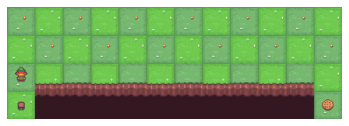

Action: UP
Done: False


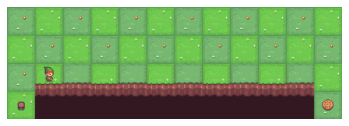

Action: RIGHT
Done: False


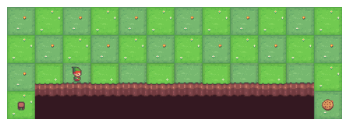

Action: RIGHT
Done: False


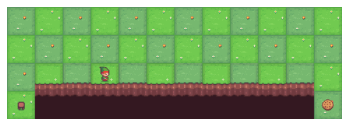

Action: RIGHT
Done: False


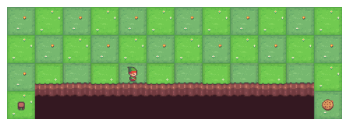

Action: RIGHT
Done: False


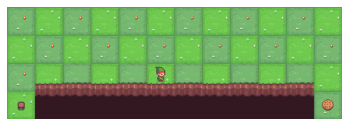

Action: RIGHT
Done: False


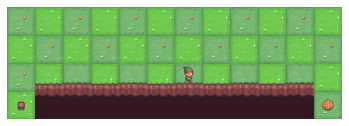

Action: RIGHT
Done: False


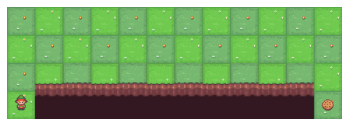

Action: DOWN
Done: False


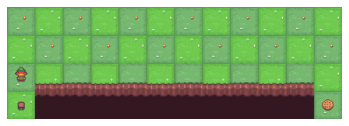

Action: UP
Done: False


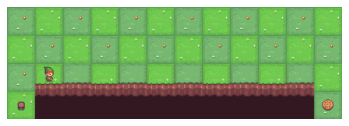

Action: RIGHT
Done: False


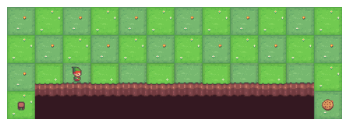

Action: RIGHT
Done: False


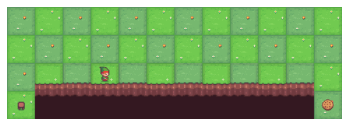

Action: RIGHT
Done: False


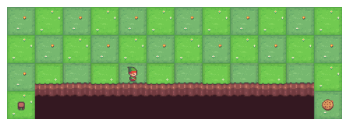

Action: RIGHT
Done: False


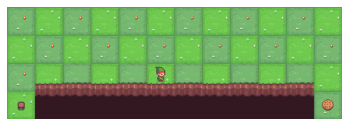

Action: RIGHT
Done: False


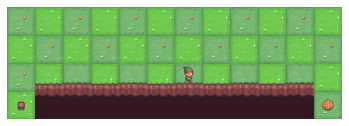

Action: RIGHT
Done: False


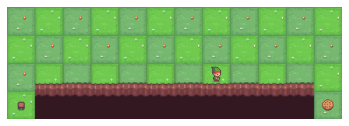

Action: RIGHT
Done: False


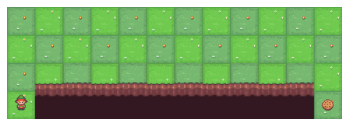

Action: DOWN
Done: False


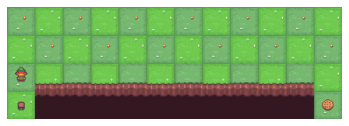

Action: UP
Done: False


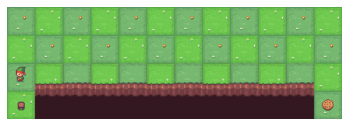

Action: LEFT
Done: False


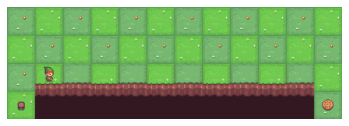

Action: RIGHT
Done: False


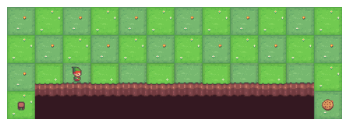

Action: RIGHT
Done: False


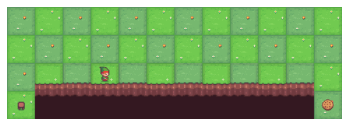

Action: RIGHT
Done: False


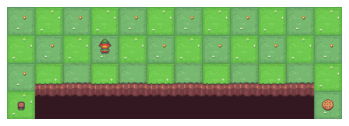

Action: UP
Done: False


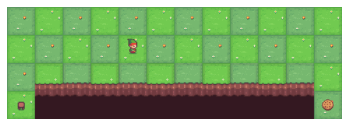

Action: RIGHT
Done: False


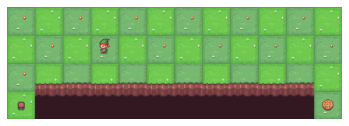

Action: LEFT
Done: False


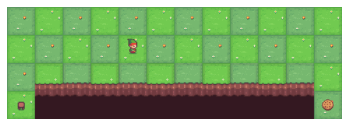

Action: RIGHT
Done: False


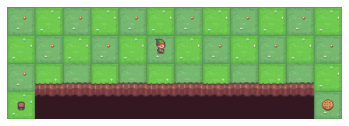

Action: RIGHT
Done: False


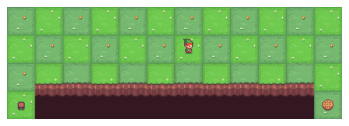

Action: RIGHT
Done: False


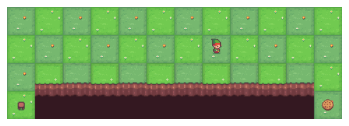

Action: RIGHT
Done: False


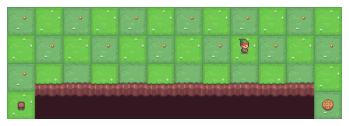

Action: RIGHT
Done: False


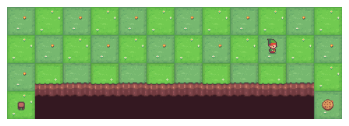

Action: RIGHT
Done: False


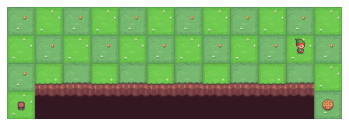

Action: RIGHT
Done: False


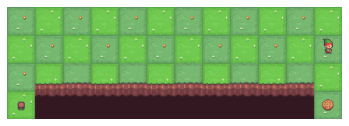

Action: RIGHT
Done: False


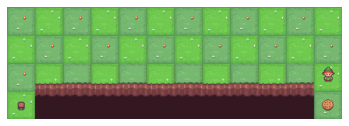

Action: DOWN
Done: False


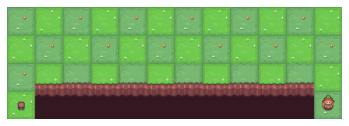

Action: DOWN
Done: True


In [142]:
#### Note: Visualization is written in Q-learning part
cliff_walker_ql = CliffWalkerQL(env, 0)
alpha = 0.8
gamma = 0.95
epsilon = 0.2
episodes = 1000
cliff_walker_ql.learn(episodes, alpha, gamma, epsilon)

This time, you should use the SARSA algorithm, which is slightly different from the Q-Learning in implementation. But the result may significantly differ, and you should explain this difference, if any. 

Note that the SARSA update rule can be represented as:

$$Q(S_t,A_t) \leftarrow Q(S_t,A_t) + \alpha \left( R_{t+1} + \gamma Q(S_{t+1},A_{t+1}) - Q(S_t,A_t) \right)$$


Where $Q(S_t,A_t)$ is the current estimate of the expected return for taking action $A_t$ in state $S_t$, $\alpha$ is the learning rate, $R_{t+1}$ is the reward received after taking action $A_t$ in state $S_t$, $\gamma$ is the discount factor, and $Q(S_{t+1},A_{t+1})$ is the estimated return for taking action $A_{t+1}$ in the next state $S_{t+1}$.

In [143]:
class CliffWalkerSARSA(Agent):
    def __init__(self, env, noise):
        super().__init__(env, noise)

    def learn(self, num_episodes, alpha, gamma, epsilon):
        number_states = self.env.observation_space.n
        number_actions = self.env.action_space.n
        self.q_values = np.zeros((number_states, number_actions))

        for episode in range(num_episodes):
            state = list(self.env.reset())[0]
            done = False

            while not done:
                if np.random.rand() < epsilon:
                    action = np.random.randint(number_actions)
                else:
                    action = np.argmax(self.q_values[state])


                if np.random.rand() > 1-self.noise:
                    action=np.random.choice(list(filter(lambda item: item!=action,[0,1,2,3])))

            # Perform action and observe reward and next state
                next_state, reward, done,_,t= self.env.step(action)

            # Choose next action using epsilon-greedy policy
                if np.random.rand() < epsilon:
                    next_action = np.random.randint(number_actions)
                else:
                    next_action = np.argmax(self.q_values[next_state])

                self.q_values[state][action] += alpha * (reward + gamma * np.max(self.q_values[next_state]) - self.q_values[state][action])
                state = next_state
                action = next_action
                
                if episode==999:
                    visualize(env)
                    print(f"Action: {Actions[action]}")
                    print(f"Done: {done}")

                if episode==9999:
                    visualize(env)
                    print(f"Action: {Actions[action]}")
                    print(f"Done: {done}")

        self.create_policy()
                

## 1-6. SARSA Evaluation (10 pts)

Train your agent and then evaluate it and display the result. Using the `visualize` function, show the path your agent takes in one of the episodes.

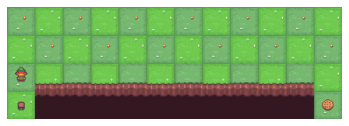

Action: DOWN
Done: False


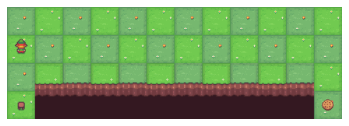

Action: RIGHT
Done: False


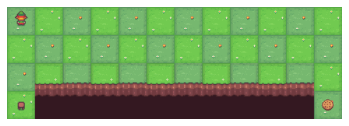

Action: LEFT
Done: False


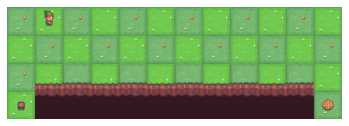

Action: UP
Done: False


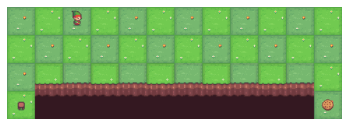

Action: DOWN
Done: False


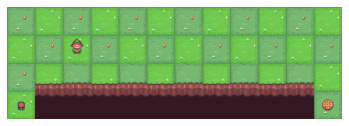

Action: LEFT
Done: False


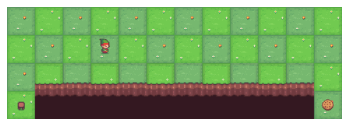

Action: UP
Done: False


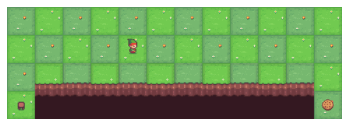

Action: RIGHT
Done: False


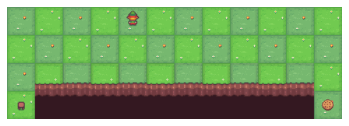

Action: DOWN
Done: False


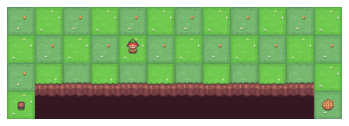

Action: RIGHT
Done: False


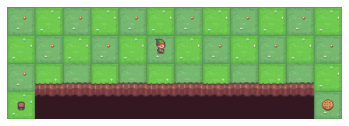

Action: LEFT
Done: False


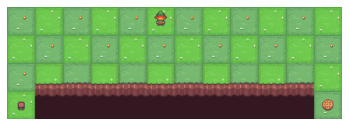

Action: UP
Done: False


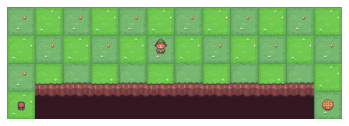

Action: RIGHT
Done: False


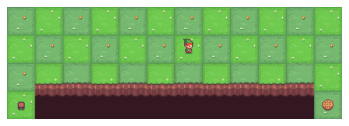

Action: RIGHT
Done: False


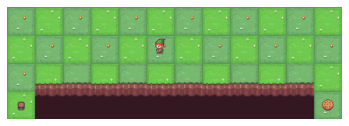

Action: UP
Done: False


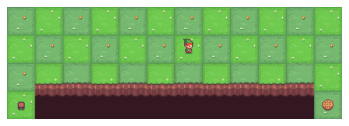

Action: RIGHT
Done: False


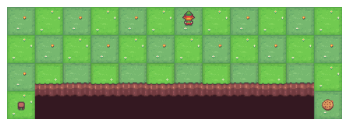

Action: RIGHT
Done: False


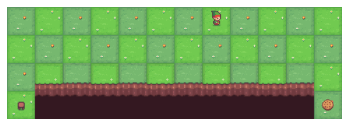

Action: RIGHT
Done: False


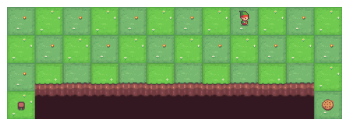

Action: RIGHT
Done: False


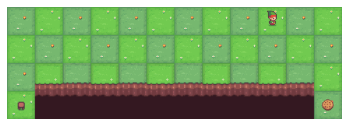

Action: RIGHT
Done: False


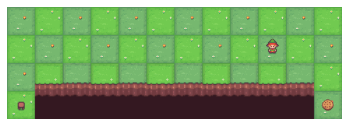

Action: LEFT
Done: False


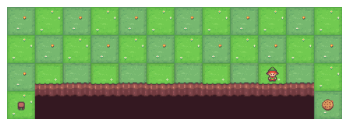

Action: RIGHT
Done: False


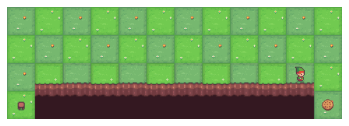

Action: RIGHT
Done: False


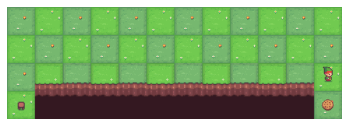

Action: DOWN
Done: False


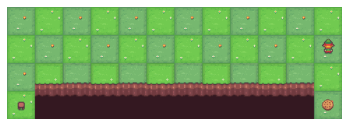

Action: UP
Done: False


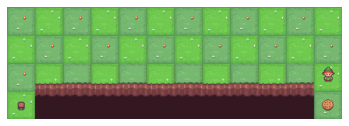

Action: DOWN
Done: False


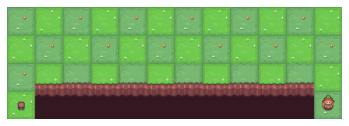

Action: UP
Done: True


In [144]:
#### Note: Visualization is written in SARSA function part
cliff_walker_sarsa = CliffWalkerSARSA(env, 0)
alpha = 0.1
gamma = 0.9
epsilon = 0.5
episodes = 1000
cliff_walker_sarsa.learn(episodes, alpha, gamma, epsilon)

## 1-7. Increase Noises (10 pts)

Increase noise and see how your obtained policy changes. Do this for both above algorithms and repeat above steps.

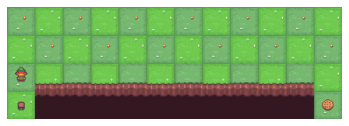

Action: UP
Done: False


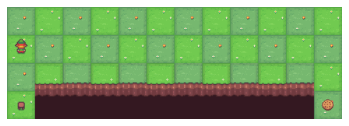

Action: UP
Done: False


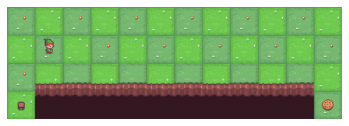

Action: RIGHT
Done: False


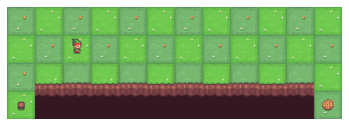

Action: RIGHT
Done: False


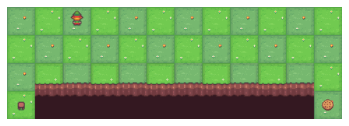

Action: UP
Done: False


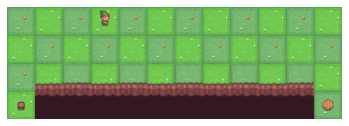

Action: RIGHT
Done: False


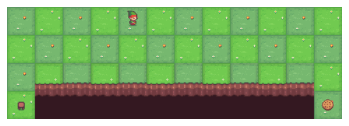

Action: RIGHT
Done: False


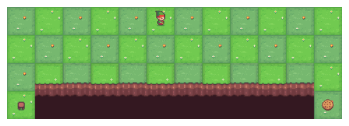

Action: RIGHT
Done: False


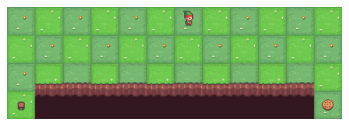

Action: RIGHT
Done: False


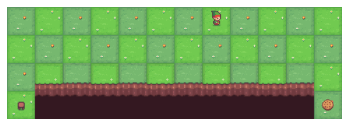

Action: RIGHT
Done: False


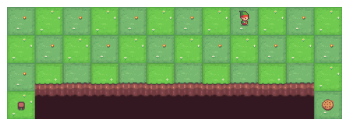

Action: RIGHT
Done: False


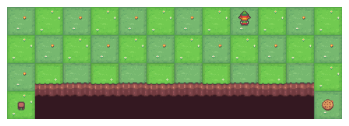

Action: UP
Done: False


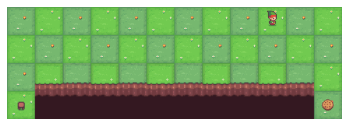

Action: RIGHT
Done: False


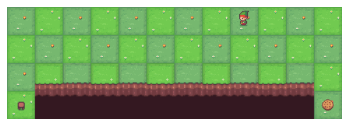

Action: LEFT
Done: False


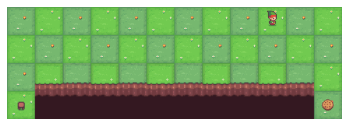

Action: RIGHT
Done: False


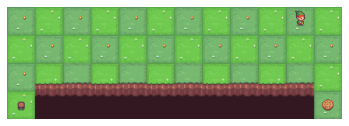

Action: RIGHT
Done: False


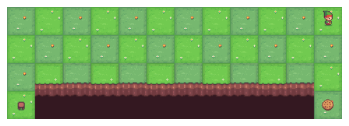

Action: RIGHT
Done: False


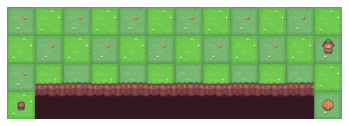

Action: DOWN
Done: False


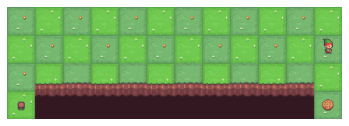

Action: RIGHT
Done: False


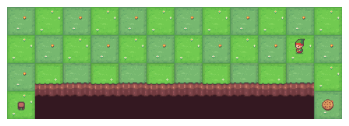

Action: LEFT
Done: False


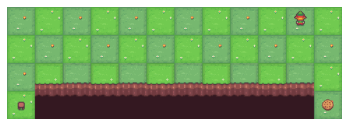

Action: UP
Done: False


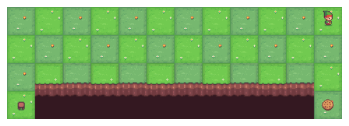

Action: RIGHT
Done: False


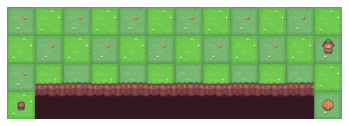

Action: DOWN
Done: False


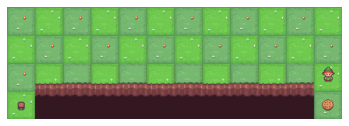

Action: DOWN
Done: False


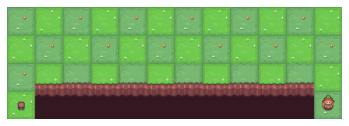

Action: DOWN
Done: True


In [145]:
# we increase noise in CliffWalkerQL function to 0.1 and run the cell
cliff_walker_ql = CliffWalkerQL(env, 0.1)
alpha = 0.8
gamma = 0.95
epsilon = 0.2
episodes = 1000
cliff_walker_ql.learn(episodes, alpha, gamma, epsilon)

# 2. Taxi Driver (30 pts)

The next game that we want to implement is **Taxi Driver**. 

## 2-1. Environment

In [146]:
env = gym.make('Taxi-v3', render_mode='rgb_array')
spec = gym.spec('Taxi-v3')

print(f"Action Space: {env.action_space}")
print(f"Observation Space: {env.observation_space}")
print(f"Max Episode Steps: {spec.max_episode_steps}")
print(f"Nondeterministic: {spec.nondeterministic}")
print(f"Reward Range: {env.reward_range}")
print(f"Reward Threshold: {spec.reward_threshold}\n")

Action Space: Discrete(6)
Observation Space: Discrete(500)
Max Episode Steps: 200
Nondeterministic: False
Reward Range: (-inf, inf)
Reward Threshold: 8



In [147]:
Actions =  {0: 'DOWN', 
            1: 'UP',
            2: 'RIGHT',
            3: 'LEFT',
            4: 'Pickup passenger',
            5: 'Drop off passenger'}

You can read more about the game and its observation space in this [link](https://gymnasium.farama.org/environments/toy_text/taxi/#observation-space).



## 2-2. Q-Learning (5 pts)

Implement Q-Learning algorithm for this problem. (Of course, you can use the code you implemented in the previous section and just enjoy the result (: )

In [148]:
### I used CliffWalkerQL class and changed the environment to Taxi-v3

## 2-3. Q-Learning Evaluation (5 pts) 

Train your agent two times, once with 1000 episodes and once with 10000 episodes. Then evaluate it and display the result. Using the `visualize` function, show the path your agent takes in one of the episodes.

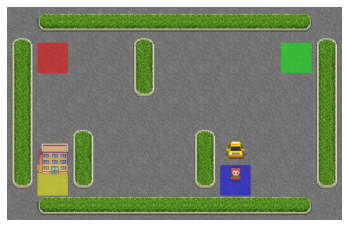

Action: DOWN
Done: False


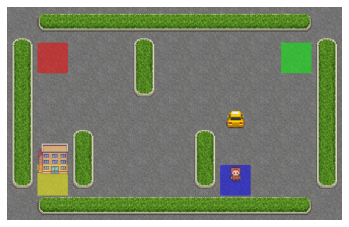

Action: UP
Done: False


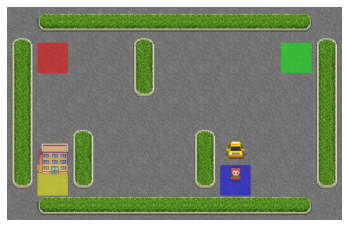

Action: DOWN
Done: False


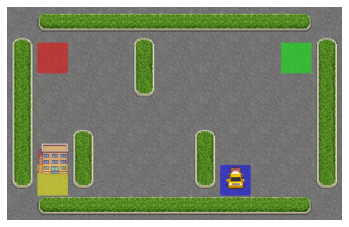

Action: DOWN
Done: False


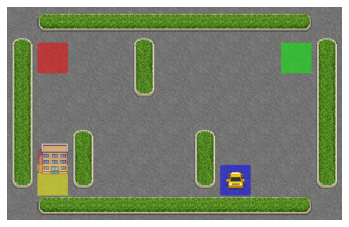

Action: Pickup passenger
Done: False


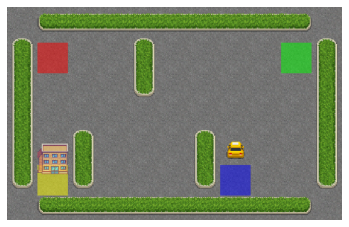

Action: UP
Done: False


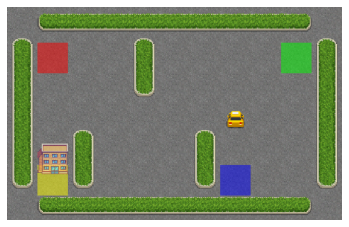

Action: UP
Done: False


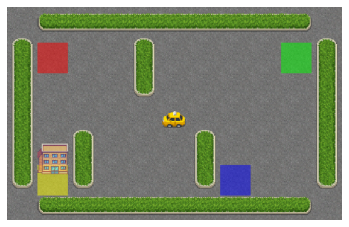

Action: LEFT
Done: False


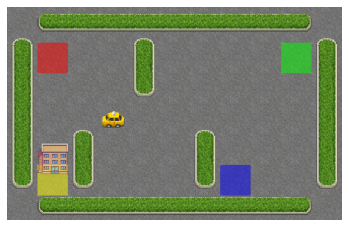

Action: LEFT
Done: False


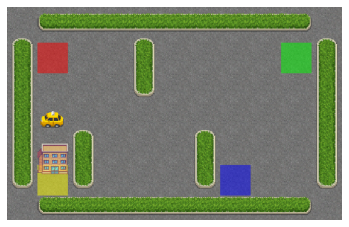

Action: LEFT
Done: False


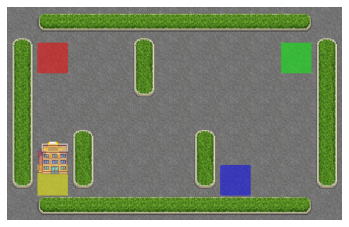

Action: DOWN
Done: False


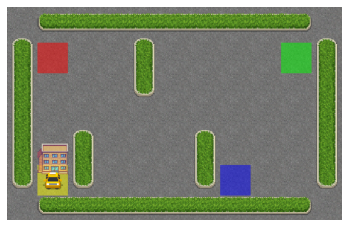

Action: DOWN
Done: False


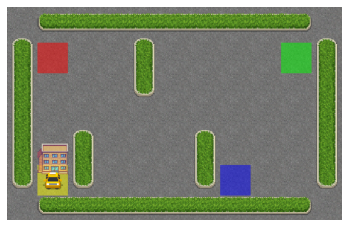

Action: DOWN
Done: False


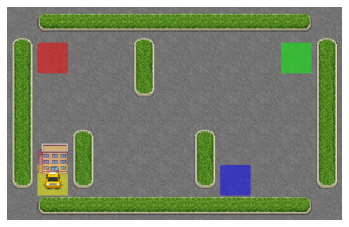

Action: Drop off passenger
Done: True


In [149]:
taxi_ql = CliffWalkerQL(env, 0)
alpha = 0.8
gamma = 0.95
epsilon = 0.2
episodes = 1000
taxi_ql.learn(episodes, alpha, gamma, epsilon)

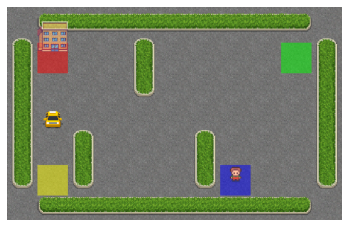

Action: DOWN
Done: False


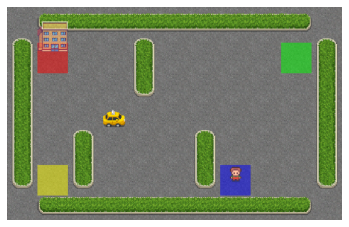

Action: RIGHT
Done: False


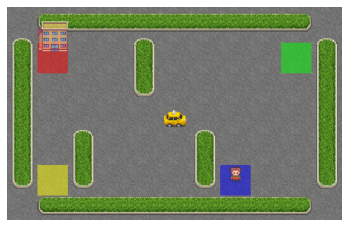

Action: RIGHT
Done: False


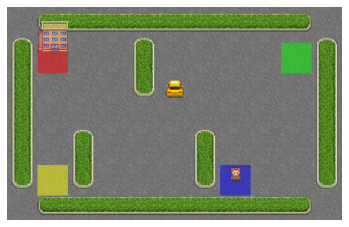

Action: UP
Done: False


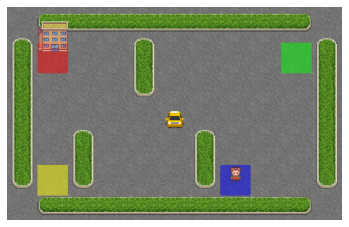

Action: DOWN
Done: False


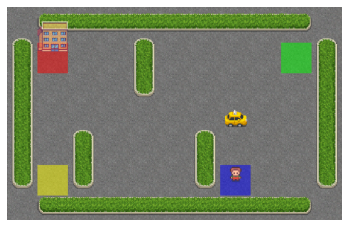

Action: RIGHT
Done: False


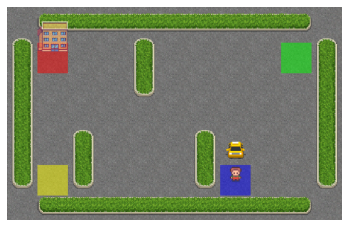

Action: DOWN
Done: False


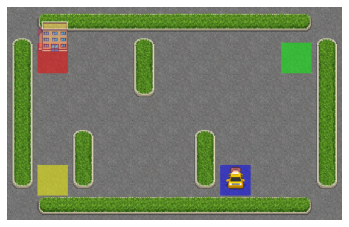

Action: DOWN
Done: False


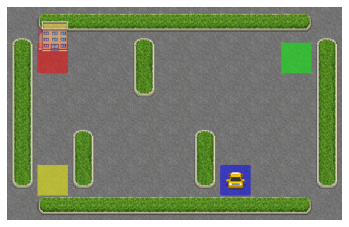

Action: Pickup passenger
Done: False


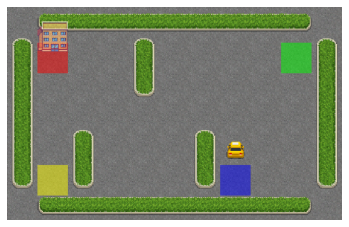

Action: UP
Done: False


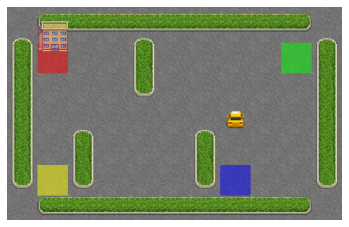

Action: UP
Done: False


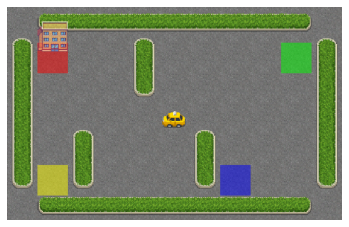

Action: LEFT
Done: False


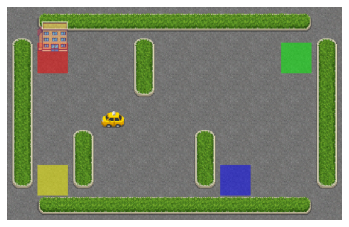

Action: LEFT
Done: False


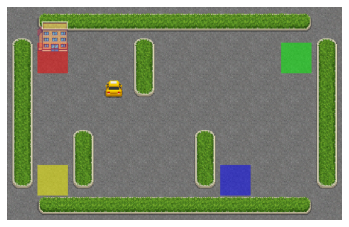

Action: UP
Done: False


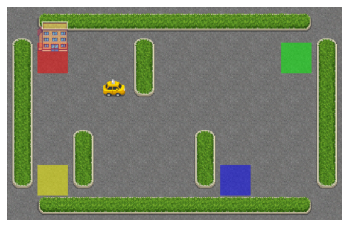

Action: RIGHT
Done: False


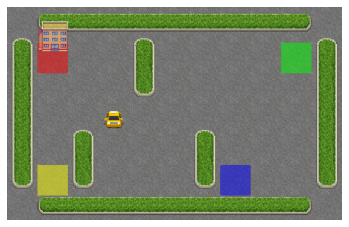

Action: DOWN
Done: False


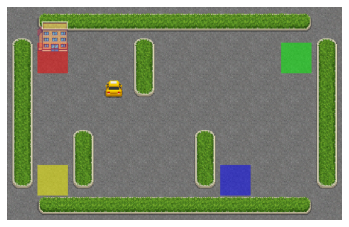

Action: UP
Done: False


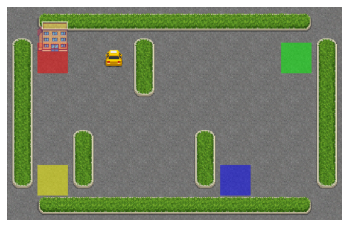

Action: UP
Done: False


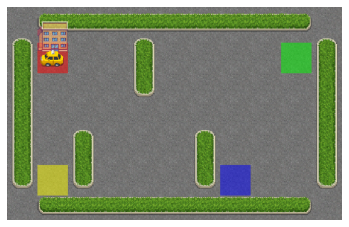

Action: LEFT
Done: False


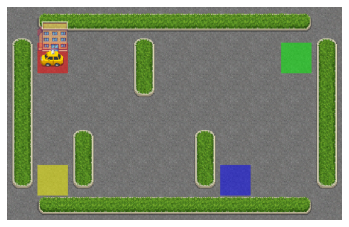

Action: Drop off passenger
Done: True


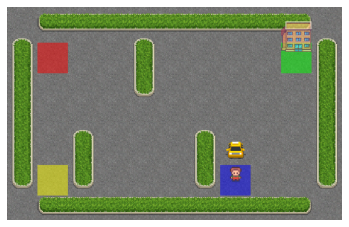

Action: DOWN
Done: False


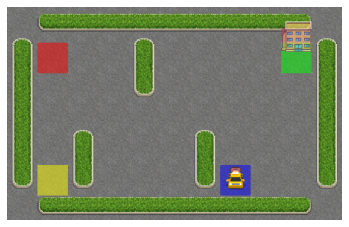

Action: DOWN
Done: False


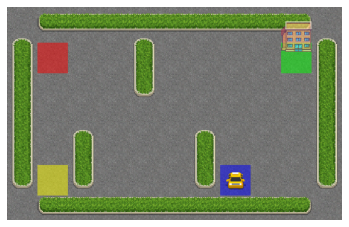

Action: Pickup passenger
Done: False


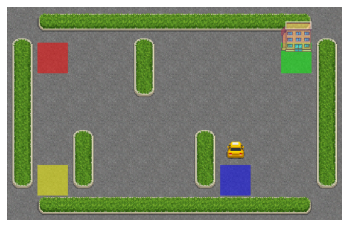

Action: UP
Done: False


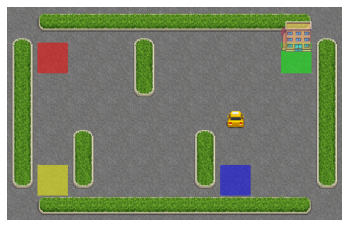

Action: UP
Done: False


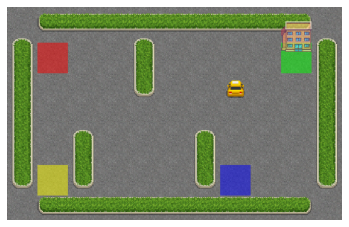

Action: UP
Done: False


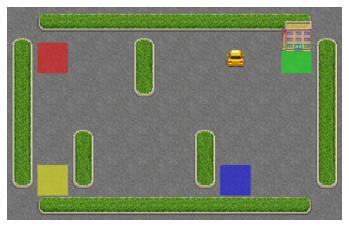

Action: UP
Done: False


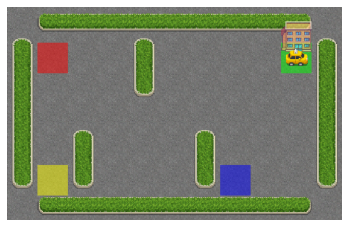

Action: RIGHT
Done: False


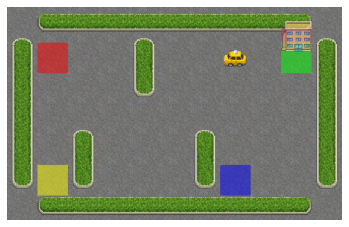

Action: LEFT
Done: False


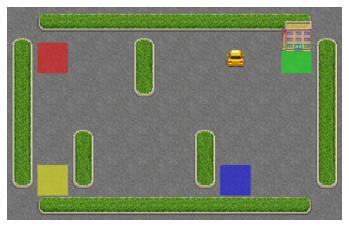

Action: UP
Done: False


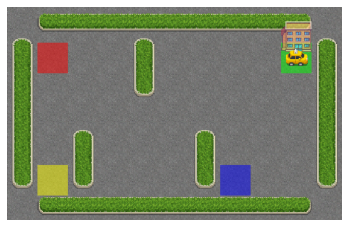

Action: RIGHT
Done: False


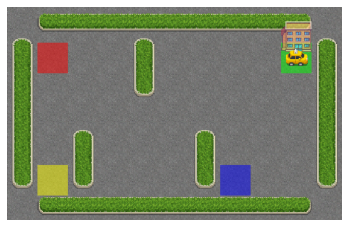

Action: RIGHT
Done: False


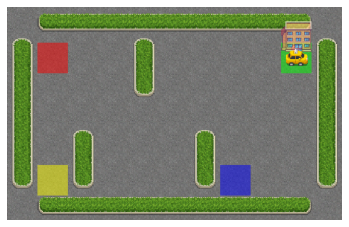

Action: Drop off passenger
Done: True


In [150]:
taxi_ql = CliffWalkerQL(env, 0)
alpha = 0.8
gamma = 0.95
epsilon = 0.2
episodes = 10000
taxi_ql.learn(episodes, alpha, gamma, epsilon)

## 2-4. TD(2) (15 pts)

In this section, you have to implement the Taxi problem using TD(2) algorithm. The difference between this method and the previous methods is in the number of movements that we look from the future.

For example, the SARSA TD(2) update rule can be represented as:

$$Q(S_t,A_t) \leftarrow Q(S_t,A_t) + \alpha \left( R_{t+1} + \gamma Q(S_{t+1},A_{t+1}) + \gamma^2 Q(s_{t+2},A_{t+2}) - Q(S_t,A_t) \right)$$


Where $Q(S_t,A_t)$ is the current estimate of the expected return for taking action $A_t$ in state $S_t$, $\alpha$ is the learning rate, $R_{t+1}$ is the reward received after taking action $A_t$ in state $S_t$, $\gamma$ is the discount factor, and $Q(S_{t+1},A_{t+1})$ is the estimated return for taking action $A_{t+1}$ in the next state $S_{t+1}$.

You can see [this video](https://youtu.be/AJiG3ykOxmY) for more details about TD methods.

In [ ]:
class TaxiTD2(Agent):
    
    def learn(self, num_episodes, alpha, gamma, epsilon):
        ######################## YOUR CODE HERE ########################

        ######################## END YOUR CODE #########################
        pass

## 2-5. TD(2) Evaluation (5 pts)

In [ ]:
taxi_td2 = TaxiTD2(env, 0)
alpha = 0
gamma = 0
epsilon = 0
episodes = 1000
taxi_td2.learn(episodes, alpha, gamma, epsilon)

In [ ]:
######################## YOUR CODE HERE ########################

######################## END YOUR CODE #########################

You can see that the TD(2) method can reach an acceptable policy faster. Try to explain why.